# Dataset Overview
In this file, I will use the `datasets` library from Huggingface to load the RAVDESS dataset. After that, I will convert the data into a DataFrame and save it in .CSV format. This step is done to facilitate exploratory data analysis (EDA) in the later stages.

# Step 0: Import Libraries
---

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import torchaudio
import mplcursors

from IPython.display import Audio
from sklearn import preprocessing
import matplotlib.gridspec as gridspec

In [2]:
plt.style.use('seaborn-v0_8')

In [3]:
matplotlib.__version__

'3.7.0'

Note: From testing, it is recommended to use Matplotlib version 3.7.0, as newer versions may cause errors when rendering waveform diagrams. because using the latest version currently will result in an error when displaying the waveform or signal graph.

# 🎯 **Step 1: Loading the Dataset**
---

1.1 RAVDESS Dataset Overview

In [5]:
df_ravdess = pd.read_csv('./Dataset/df_ravdess.csv')

df_ravdess.head()

,Path,Emotion
0,./Dataset/Audio/Speech_RAVDESS\Actor_01\03-01-...,neutral
1,./Dataset/Audio/Speech_RAVDESS\Actor_01\03-01-...,neutral
2,./Dataset/Audio/Speech_RAVDESS\Actor_01\03-01-...,neutral
3,./Dataset/Audio/Speech_RAVDESS\Actor_01\03-01-...,neutral
4,./Dataset/Audio/Speech_RAVDESS\Actor_01\03-01-...,calm


## ✨ 1.2 TESS Dataset

In [6]:
df_tess = pd.read_csv('./Dataset/df_tess.csv')

df_tess.head()

,Path,Emotion
0,./Dataset/Audio/Speech_TESS\OAF_back_angry.wav,angry
1,./Dataset/Audio/Speech_TESS\OAF_back_disgust.wav,disgust
2,./Dataset/Audio/Speech_TESS\OAF_back_fear.wav,fearful
3,./Dataset/Audio/Speech_TESS\OAF_back_happy.wav,happy
4,./Dataset/Audio/Speech_TESS\OAF_back_neutral.wav,neutral


## ✨ 1.3 SAVEE Dataset

In [7]:
df_savee = pd.read_csv('./Dataset/df_savee.csv')

df_savee.head()

,Path,Emotion
0,./Dataset/Audio/Speech_SAVEE\ALL\DC_a01.wav,angry
1,./Dataset/Audio/Speech_SAVEE\ALL\DC_a02.wav,angry
2,./Dataset/Audio/Speech_SAVEE\ALL\DC_a03.wav,angry
3,./Dataset/Audio/Speech_SAVEE\ALL\DC_a04.wav,angry
4,./Dataset/Audio/Speech_SAVEE\ALL\DC_a05.wav,angry


## ✨ 1.4 Combined Dataset

In [4]:
df_combined = pd.read_csv('./Dataset/df_combined.csv')

df_combined.head()

,Path,Emotion
0,./Dataset/Audio/Speech_RAVDESS\Actor_01\03-01-...,neutral
1,./Dataset/Audio/Speech_RAVDESS\Actor_01\03-01-...,neutral
2,./Dataset/Audio/Speech_RAVDESS\Actor_01\03-01-...,neutral
3,./Dataset/Audio/Speech_RAVDESS\Actor_01\03-01-...,neutral
4,./Dataset/Audio/Speech_RAVDESS\Actor_01\03-01-...,calm


# 🎯 **Step 2: Check column and row totals**
---

## ✨ 2.1 RAVDESS Dataset

In [13]:
print('Rows total: ', df_ravdess.shape[0])

print('Columns total: ', df_ravdess.shape[1])

Rows total:  1440
Columns total:  2


## ✨ 2.2 TESS Dataset

In [9]:
print('Rows total: ', df_tess.shape[0])

print('Columns total: ', df_tess.shape[1])

Rows total:  2800
Columns total:  2


## ✨ 2.3 SAVEE Dataset

In [10]:
print('Rows total: ', df_savee.shape[0])

print('Columns total: ', df_savee.shape[1])

Rows total:  480
Columns total:  2


## ✨ 2.4 Combined Dataset

In [5]:
print('Rows total: ', df_combined.shape[0])

print('Columns total: ', df_combined.shape[1])

Rows total:  5120
Columns total:  2


# 🎯 **Step 3: Check data info**
---

## ✨ 3.1 RAVDESS Dataset

In [14]:
df_ravdess.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1440 entries, 0 to 1439
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Path     1440 non-null   object
 1   Emotion  1440 non-null   object
dtypes: object(2)
memory usage: 22.6+ KB


## ✨ 3.2 TESS Dataset

In [15]:
df_tess.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2800 entries, 0 to 2799
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Path     2800 non-null   object
 1   Emotion  2800 non-null   object
dtypes: object(2)
memory usage: 43.9+ KB


## ✨ 3.3 SAVEE Dataset

In [16]:
df_savee.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 480 entries, 0 to 479
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Path     480 non-null    object
 1   Emotion  480 non-null    object
dtypes: object(2)
memory usage: 7.6+ KB


## ✨ 3.4 Combined Dataset

In [17]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4720 entries, 0 to 4719
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Path     4720 non-null   object
 1   Emotion  4720 non-null   object
dtypes: object(2)
memory usage: 73.9+ KB


# 🎯 **Step 4: Compare the distribution of the "labels" column**
---

## ✨ 4.1 RAVDESS Dataset

In [9]:
emotions_count_ravdess = df_ravdess['Emotion'].value_counts(ascending=False)

emotions_count_ravdess

Emotion
calm         192
happy        192
sad          192
angry        192
fearful      192
disgust      192
surprised    192
neutral       96
Name: count, dtype: int64

## ✨ 4.2 TESS Dataset

In [10]:
emotions_count_tess = df_tess['Emotion'].value_counts(ascending=False)

emotions_count_tess

Emotion
angry        400
disgust      400
fearful      400
happy        400
neutral      400
surprised    400
sad          400
Name: count, dtype: int64

## ✨ 4.3 SAVEE Dataset

In [11]:
emotions_count_savee = df_savee['Emotion'].value_counts(ascending=False)

emotions_count_savee

Emotion
neutral      120
angry         60
disgust       60
fearful       60
happy         60
sad           60
surprised     60
Name: count, dtype: int64

## ✨ 4.4 Combined Dataset

In [6]:
emotions_count_combined = df_combined['Emotion'].value_counts(ascending=False)

emotions_count_combined

Emotion
happy        752
sad          752
angry        752
neutral      716
fearful      652
disgust      652
surprised    652
calm         192
Name: count, dtype: int64

## ✨ 4.5 Display the Diagram

C:\Users\LENOVO YOGA\AppData\Local\Temp\ipykernel_11768\2781173222.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.values, y=counts.index, palette='rocket', ax=ax)
C:\Users\LENOVO YOGA\AppData\Local\Temp\ipykernel_11768\2781173222.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.values, y=counts.index, palette='rocket', ax=ax)
C:\Users\LENOVO YOGA\AppData\Local\Temp\ipykernel_11768\2781173222.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.values, y=counts.index, palette='rocket', ax=ax)
C:\Users\LENOVO 

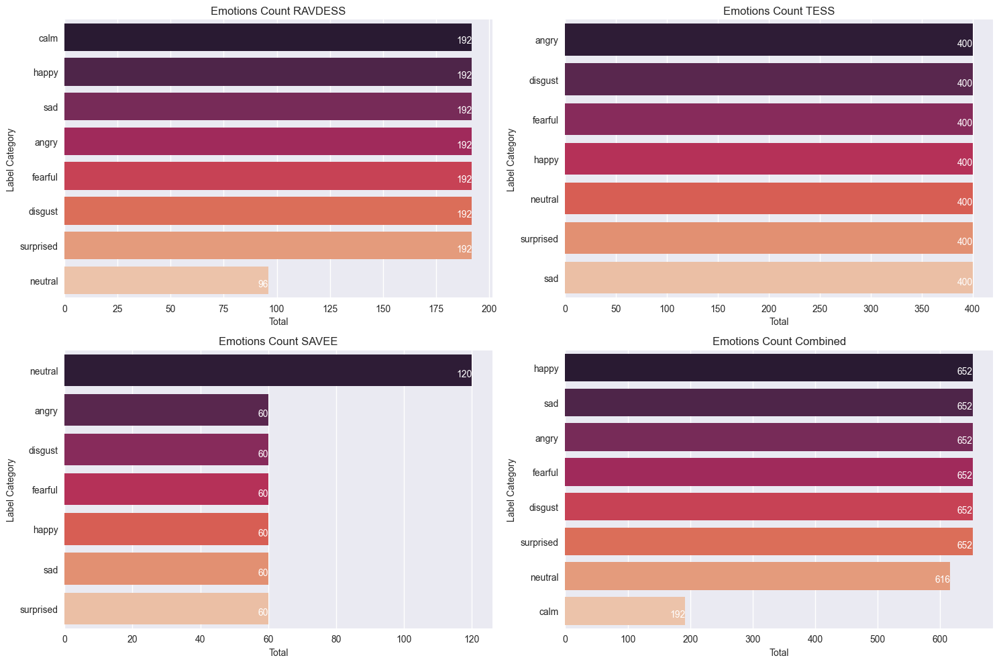

In [24]:

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))

data = [emotions_count_ravdess, emotions_count_tess, emotions_count_savee, emotions_count_combined]
titles = ['Emotions Count RAVDESS', 'Emotions Count TESS', 'Emotions Count SAVEE', 'Emotions Count Combined']

for i, (ax, counts, title) in enumerate(zip(axes.flatten(), data, titles)):
    sns.barplot(x=counts.values, y=counts.index, palette='rocket', ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Total')
    ax.set_ylabel('Label Category')

    # Annotate each bar
    for p in ax.patches:
        ax.annotate(f'{int(p.get_width())}', (p.get_x() + p.get_width(), p.get_y() + 0.5), ha='right', va='center', color='white') 

plt.tight_layout()

plt.show()


Note: Based on the graph above, it can be seen that the distribution of data across labels is unbalanced, so data balancing must be performed.

# 🎯 **Step 5: Display signal graph of each label**
---

In [12]:
unique_intent_classes_ravdess = np.unique(df_ravdess['Emotion'])
unique_intent_classes_tess = np.unique(df_tess['Emotion'])
unique_intent_classes_savee = np.unique(df_savee['Emotion'])

In [13]:
def select_samples_by_intent(df, intent_classes):
    selected_samples = {}

    for intent_class in intent_classes:
        index = np.where(np.array(df['Emotion']) == intent_class)[0][0]

        selected_samples[intent_class] = {
            'path': df['Path'].iloc[index],
        }

    return selected_samples

In [14]:
result_ravdess = select_samples_by_intent(df_ravdess, unique_intent_classes_ravdess)
result_tess = select_samples_by_intent(df_tess, unique_intent_classes_tess)
result_savee = select_samples_by_intent(df_savee, unique_intent_classes_savee)

In [15]:
result_savee

{'angry': {'path': './Dataset/Audio/Speech_SAVEE\\ALL\\DC_a01.wav'},
 'disgust': {'path': './Dataset/Audio/Speech_SAVEE\\ALL\\DC_d01.wav'},
 'fearful': {'path': './Dataset/Audio/Speech_SAVEE\\ALL\\DC_f01.wav'},
 'happy': {'path': './Dataset/Audio/Speech_SAVEE\\ALL\\DC_h01.wav'},
 'neutral': {'path': './Dataset/Audio/Speech_SAVEE\\ALL\\DC_n01.wav'},
 'sad': {'path': './Dataset/Audio/Speech_SAVEE\\ALL\\DC_sa01.wav'},
 'surprised': {'path': './Dataset/Audio/Speech_SAVEE\\ALL\\DC_su01.wav'}}

## ✨ 5.1 Waveform diagram

In [34]:
def plot_waveplots(selected_samples):
    num_samples = len(selected_samples)
    num_rows = num_samples // 2 + num_samples % 2  # Add 1 row if the number of keys is odd
    num_cols = 2

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

    for i, (key, audio_info) in enumerate(selected_samples.items()):
        row_idx = i // 2
        col_idx = i % 2
        ax = axes[row_idx, col_idx]

        data, sampling_rate = librosa.load(audio_info['path'])

        librosa.display.waveshow(data, sr=sampling_rate, ax=ax)

        ax.set_title(f'Waveplot {key}', fontweight='bold')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Amplitude')

    # Remove last subplot if the number of keys is odd
    if num_samples % 2 == 1:
        fig.delaxes(axes[-1, -1])

    # Adjust layout
    plt.tight_layout()
    plt.show()


### 📫 5.1.1 RAVDESS Dataset

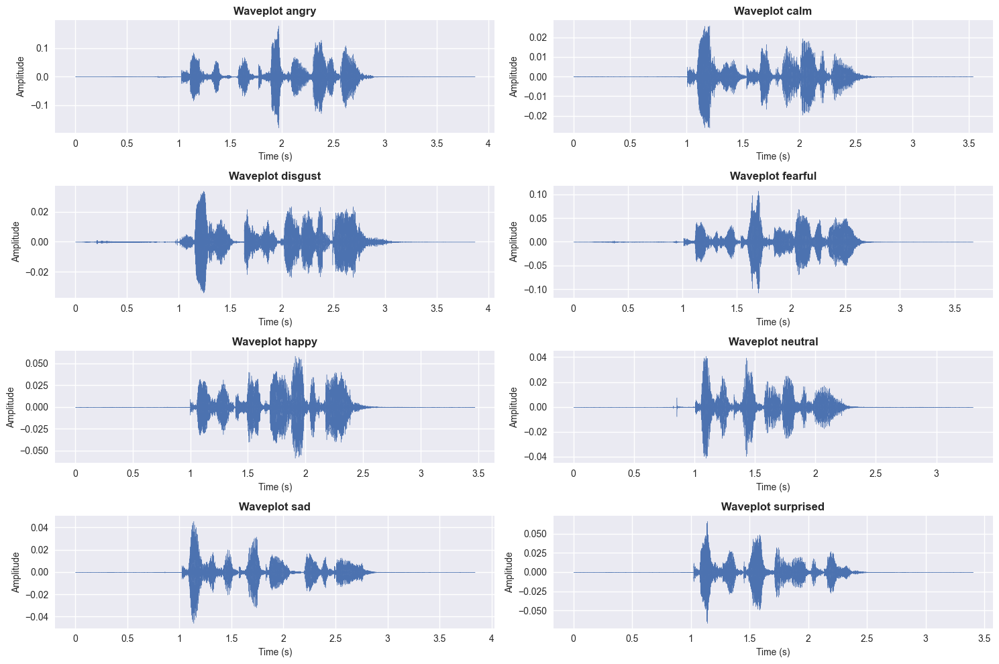

In [35]:
plot_waveplots(result_ravdess)

### 📫 5.1.2 TESS Dataset

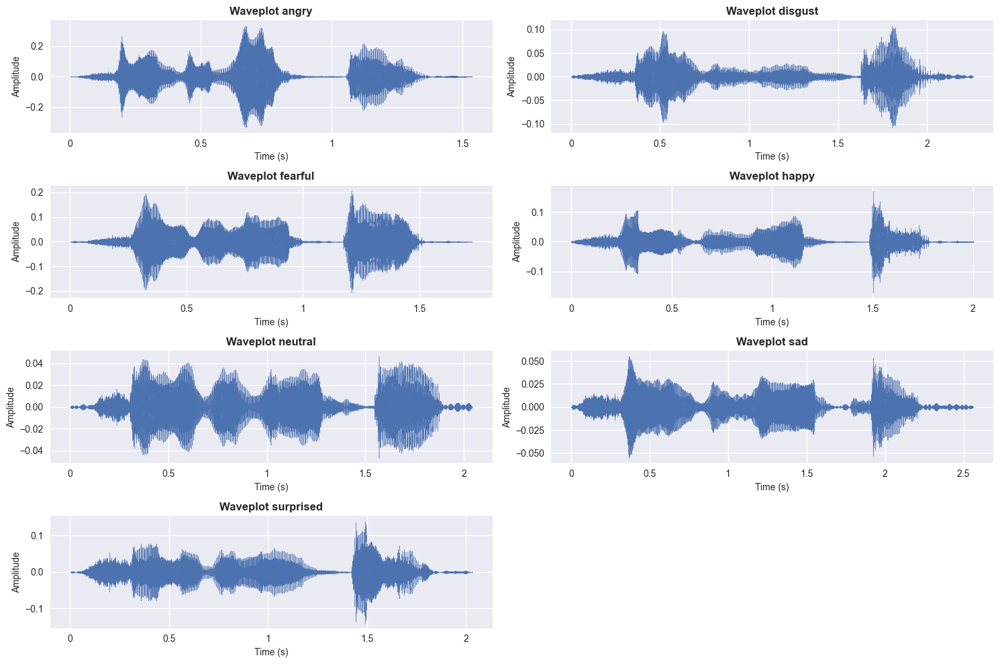

In [64]:
plot_waveplots(result_tess)

### 📫 5.1.3 SAVEE Dataset

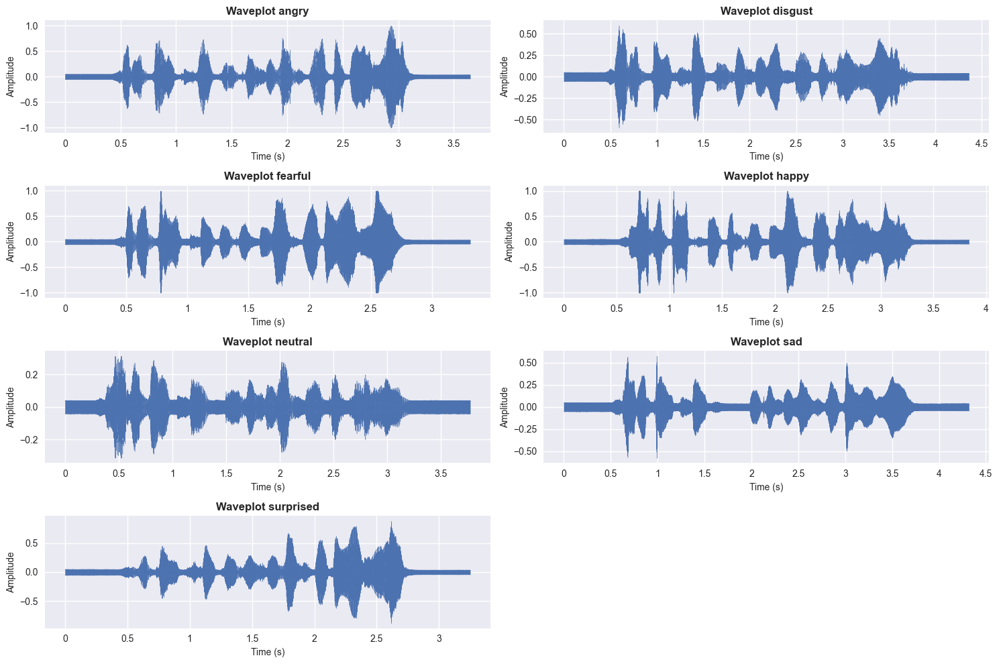

In [65]:
plot_waveplots(result_savee)

## ✨ 5.2 Spectogram diagram

### 📫 5.2.1 Hertz

In [55]:
def plot_spectrograms(selected_samples):
    num_samples = len(selected_samples)
    num_rows = num_samples // 2 + num_samples % 2  # Add 1 row if the number of keys is odd
    num_cols = 2

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

    for i, (key, audio_info) in enumerate(selected_samples.items()):
        row_idx = i // num_cols
        col_idx = i % num_cols
        ax = axes[row_idx, col_idx]

        data, sampling_rate = librosa.load(audio_info['path'])

        X = librosa.stft(data)
        Xdb = librosa.amplitude_to_db(abs(X))
        img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='hz', ax=ax)
        plt.colorbar(img, ax=ax)

        ax.set_title(f'Spectrogram Hz {key}', fontweight='bold')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Frequency (Hz)')

    # Remove last subplot if the number of keys is odd
    if num_samples % 2 == 1:
        fig.delaxes(axes[-1, -1])

    # Adjust layout
    plt.tight_layout()
    plt.show()

#### ✏️ 5.2.1.1 RAVDESS Dataset

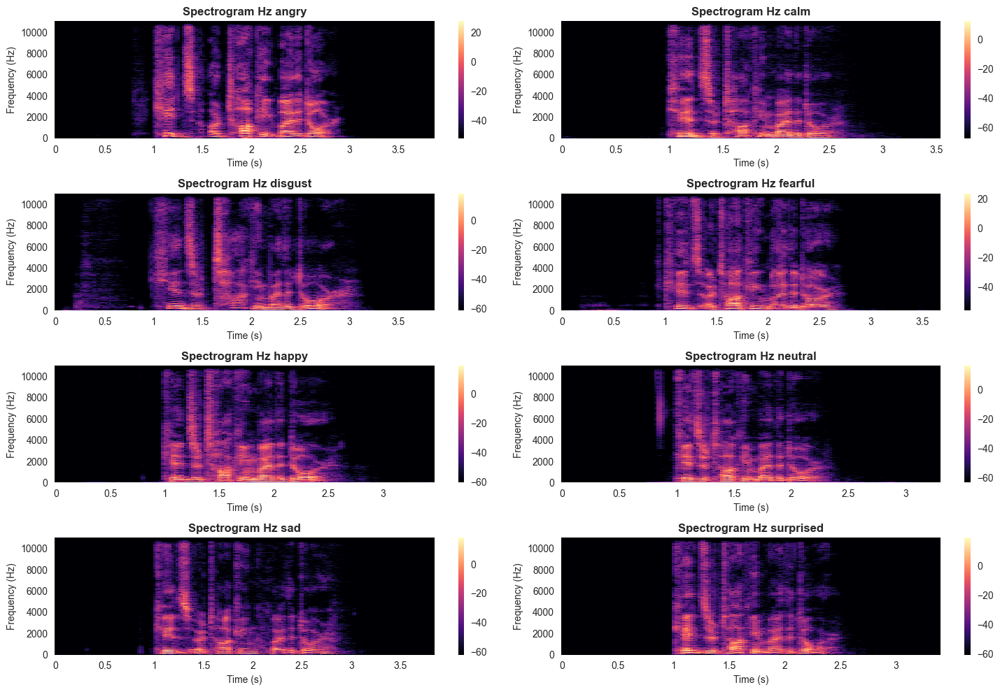

In [56]:
plot_spectrograms(result_ravdess)

#### ✏️ 5.2.1.2 TESS Dataset

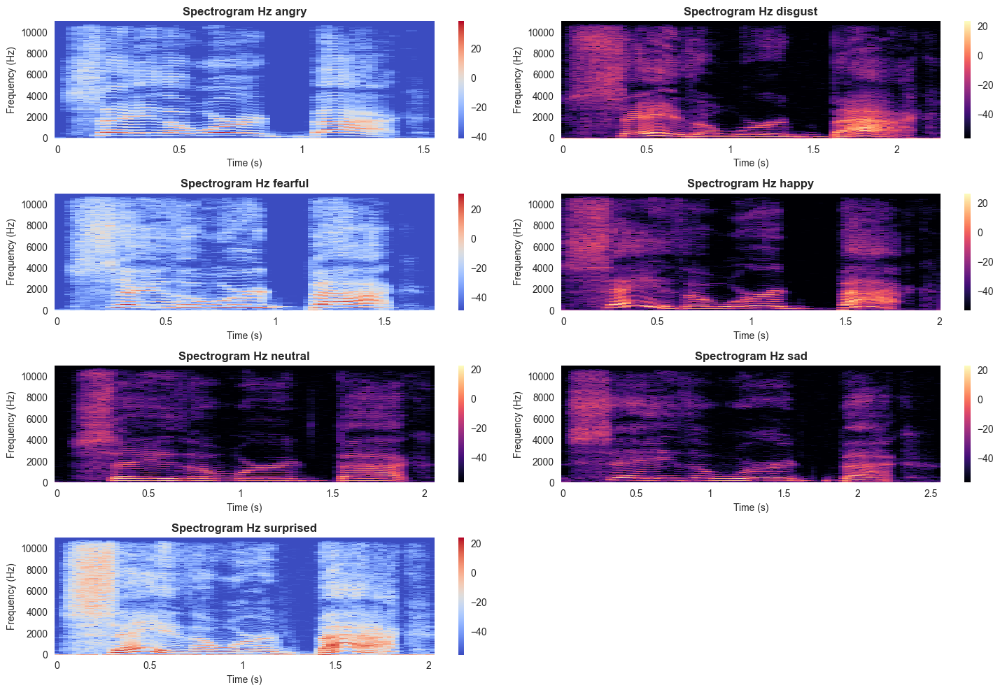

In [57]:
plot_spectrograms(result_tess)

#### ✏️ 5.2.1.3 SAVEE Dataset

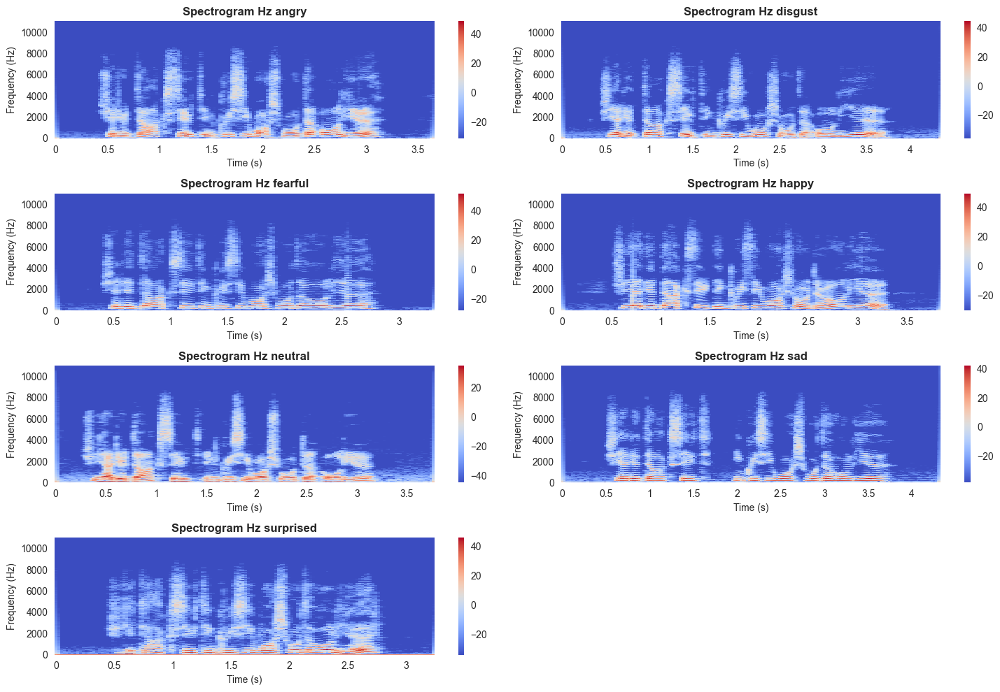

In [66]:
plot_spectrograms(result_savee)

### 📫 5.2.2 Log

🔎 The spectrum is displayed on a logarithmic scale, where differences between small values are magnified, allowing more detail to be seen in the lower frequency regions.

In [68]:
def plot_log_spectrograms(selected_samples):
    num_samples = len(selected_samples)
    num_rows = num_samples // 2 + num_samples % 2  # Add 1 row if the number of keys is odd
    num_cols = 2

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

    for i, (key, audio_info) in enumerate(selected_samples.items()):
        row_idx = i // 2
        col_idx = i % 2
        ax = axes[row_idx, col_idx]

        data, sampling_rate = librosa.load(audio_info['path'])

        X = librosa.stft(data)
        Xdb = librosa.amplitude_to_db(abs(X))
        img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='log', ax=ax)
        plt.colorbar(img, ax=ax)

        ax.set_title(f'Spectrogram Log {key}', fontweight='bold')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Frequency (Hz)')
    
    # Remove last subplot if the number of keys is odd
    if num_samples % 2 == 1:
        fig.delaxes(axes[-1, -1])

    # Adjust layout
    plt.tight_layout()
    plt.show()

#### ✏️ 5.2.2.1 RAVDESS Dataset

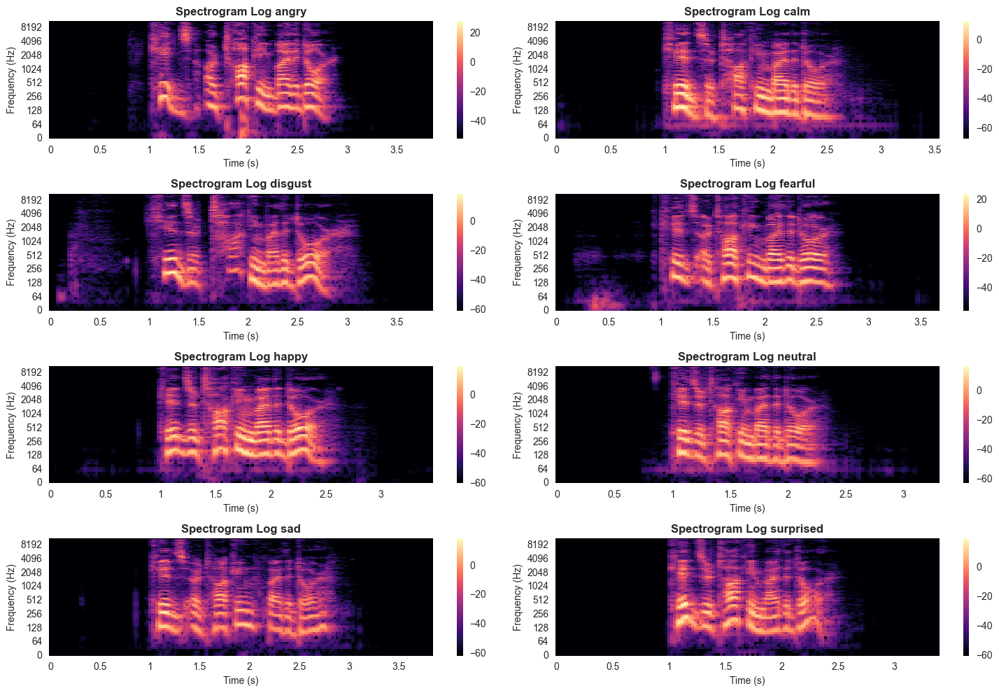

In [69]:
plot_log_spectrograms(result_ravdess)

#### ✏️ 5.2.2.2 TESS Dataset

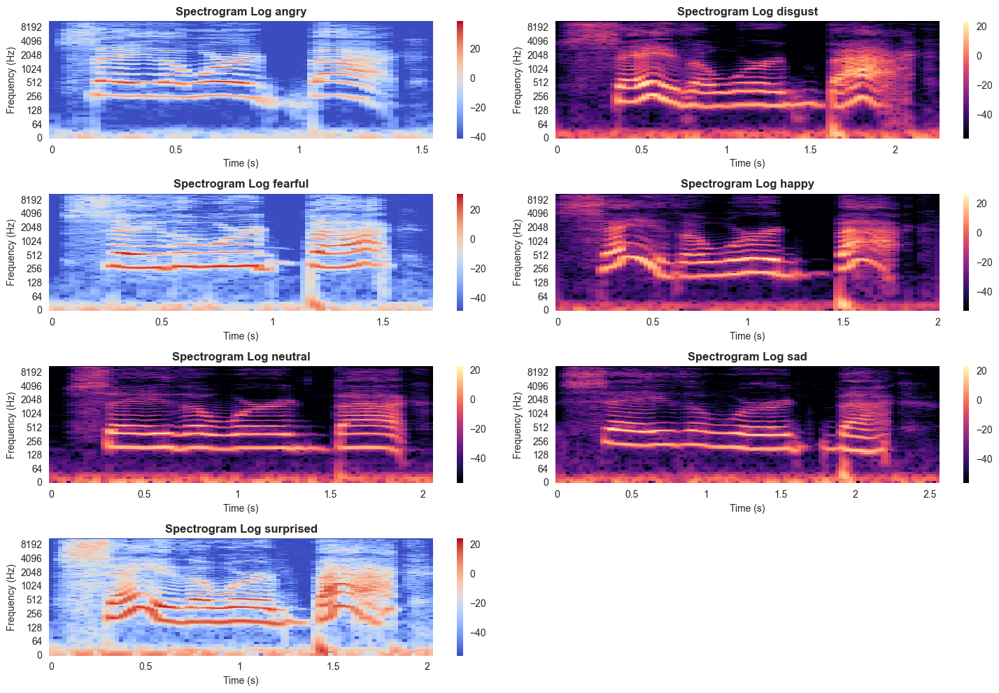

In [70]:
plot_log_spectrograms(result_tess)

#### ✏️ 5.2.2.3 SAVEE Dataset

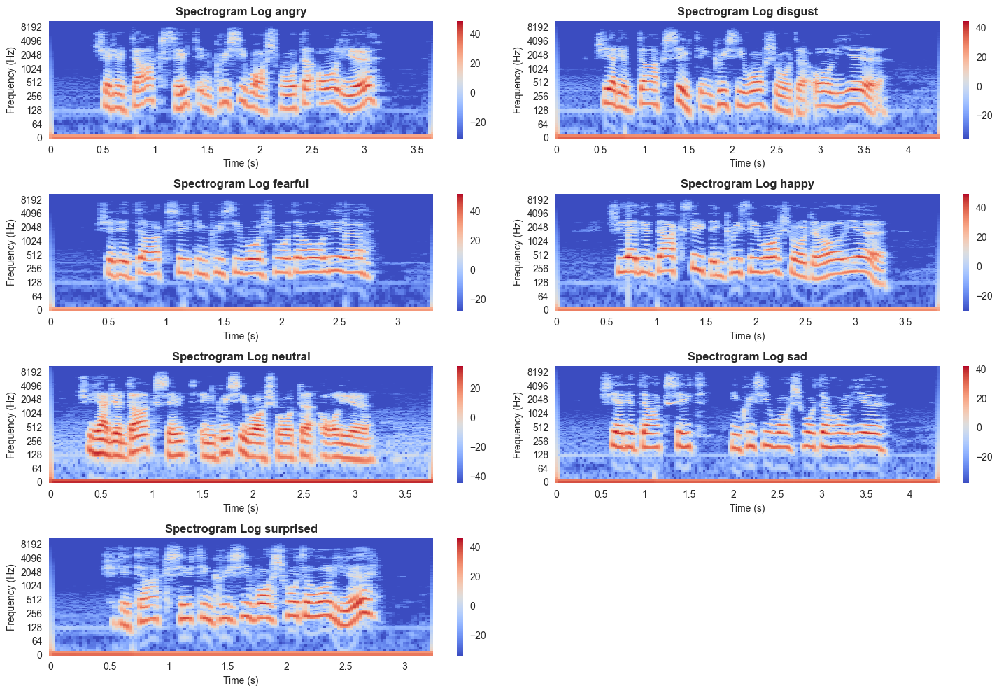

In [71]:
plot_log_spectrograms(result_savee)

### 📫 5.2.3 Mel

🔎 Frequency is determined by the Mel scale, which is adapted to the way human hearing perceives sounds. This helps present the spectrogram in a more intuitive manner in line with human auditory perception.

In [75]:
def plot_mel_spectrograms(selected_samples):
    num_samples = len(selected_samples)
    num_rows = num_samples // 2 + num_samples % 2  # Add 1 row if the number of keys is odd
    num_cols = 2

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

    for i, (key, audio_info) in enumerate(selected_samples.items()):
        row_idx = i // 2
        col_idx = i % 2
        ax = axes[row_idx, col_idx]

        data, sampling_rate = librosa.load(audio_info['path'])

        X = librosa.stft(data)
        Xdb = librosa.amplitude_to_db(abs(X))
        img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='mel', ax=ax)
        plt.colorbar(img, ax=ax)

        ax.set_title(f'Spectrogram Mel {key}', fontweight='bold')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Frequency (Hz)')
    
    # Remove last subplot if the number of keys is odd
    if num_samples % 2 == 1:
        fig.delaxes(axes[-1, -1])

    # Adjust layout
    plt.tight_layout()
    plt.show()

#### ✏️ 5.2.3.1 RAVDESS Dataset

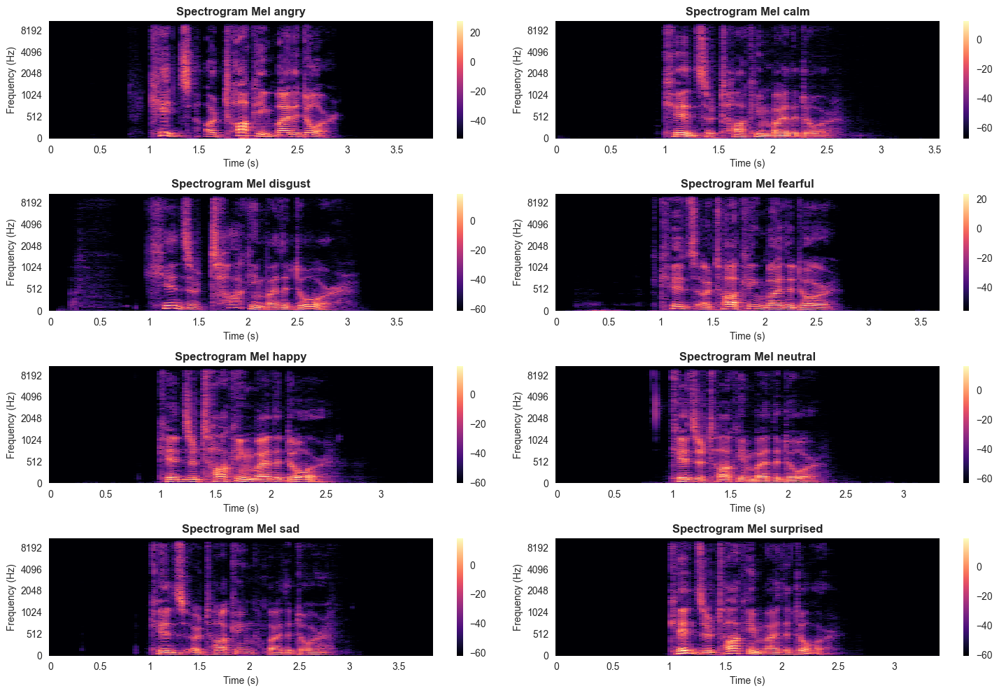

In [76]:
plot_mel_spectrograms(result_ravdess)

#### ✏️ 5.2.3.2 TESS Dataset

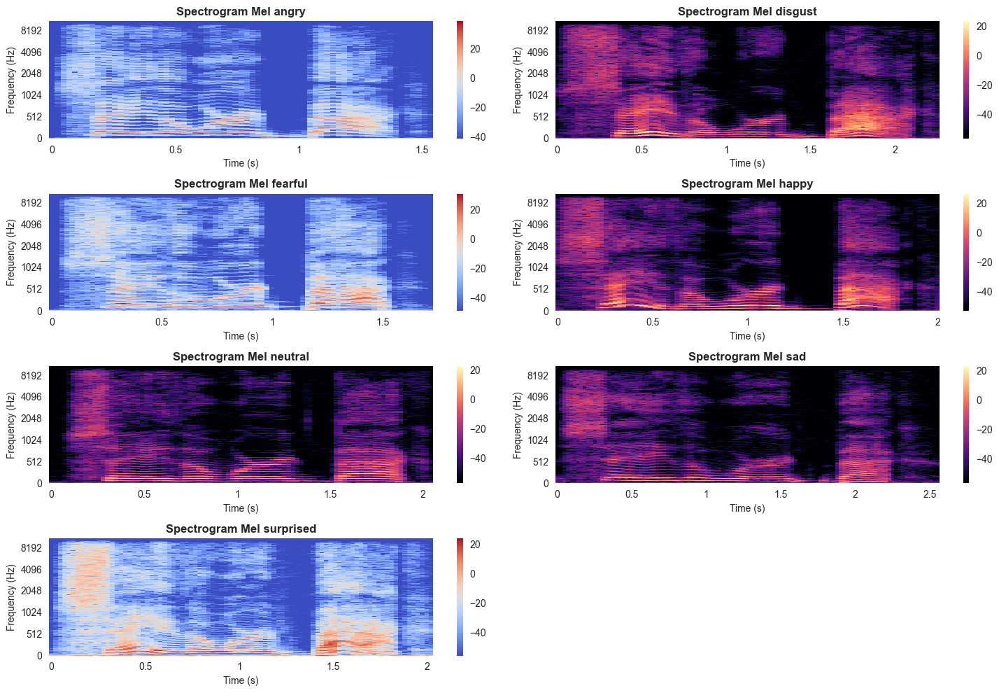

In [77]:
plot_mel_spectrograms(result_tess)

#### ✏️ 5.2.3.3 SAVEE Dataset

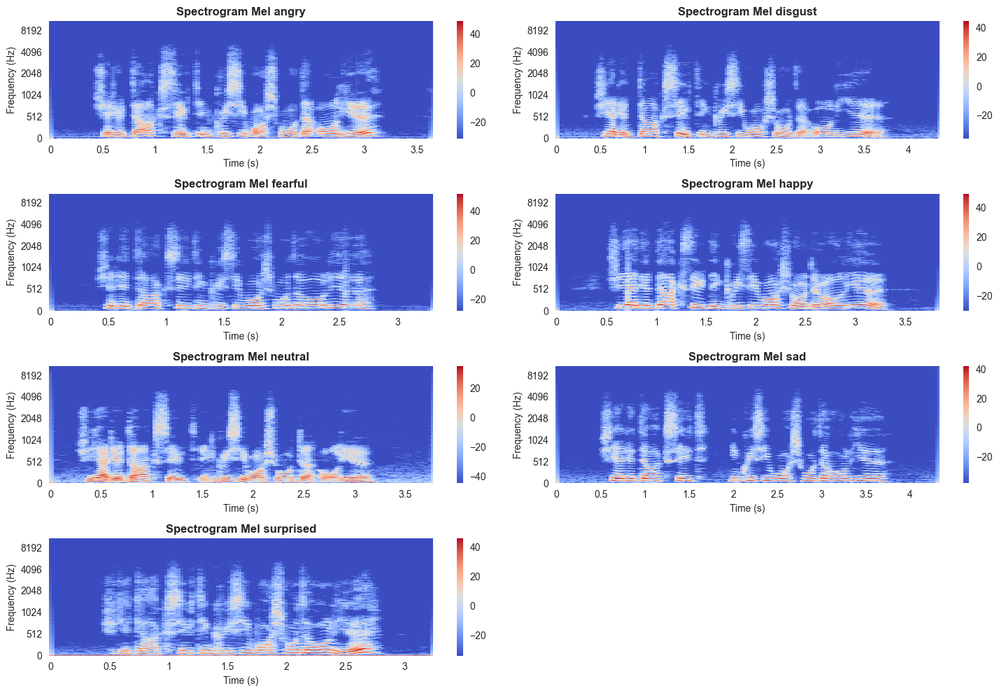

In [78]:
plot_mel_spectrograms(result_savee)

# 🎯 **Step 6: Display spectral centroid of each label in Hertz**
---

🔎 The spectral centroid provides an idea of how far the frequency center of mass is located in the sound spectrum. The higher the spectral centroid, the more concentrated the frequencies are in the high part of the spectrum, which can be interpreted as a brighter or higher sound. Conversely, a lower spectral centroid may indicate a fainter or lower sound.

In [85]:
def plot_waveplot_with_spectral_centroid(selected_samples):

    num_samples = len(selected_samples)
    num_rows = num_samples // 2 + num_samples % 2  # Add 1 row if the number of keys is odd
    num_cols = 2

    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

    for i, (key, audio_info) in enumerate(selected_samples.items()):
        
        row_idx = i // 2
        col_idx = i % 2
        ax = axes[row_idx, col_idx]
        
        data, sampling_rate = librosa.load(audio_info['path'])

        X = librosa.stft(data)
        Xdb = librosa.amplitude_to_db(abs(X))
        img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='log', ax=ax)
        plt.colorbar(img, ax=ax)

        ax.set_title(f'Spectrogram Log {key}',  fontweight='bold')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Frequency (Hz)')

        # Add Spectral Centroid plot
        spectral_centroids = librosa.feature.spectral_centroid(y=data, sr=sampling_rate)[0]
        frames = range(len(spectral_centroids))
        t = librosa.frames_to_time(frames)
        ax.plot(t, spectral_centroids, color='yellow', label='Spectral Centroid')
    
    # Remove last subplot if the number of keys is odd
    if num_samples % 2 == 1:
        fig.delaxes(axes[-1, -1])

    # Adjust layout
    plt.tight_layout()
    plt.show()

## ✨ 6.1 RAVDESS Dataset

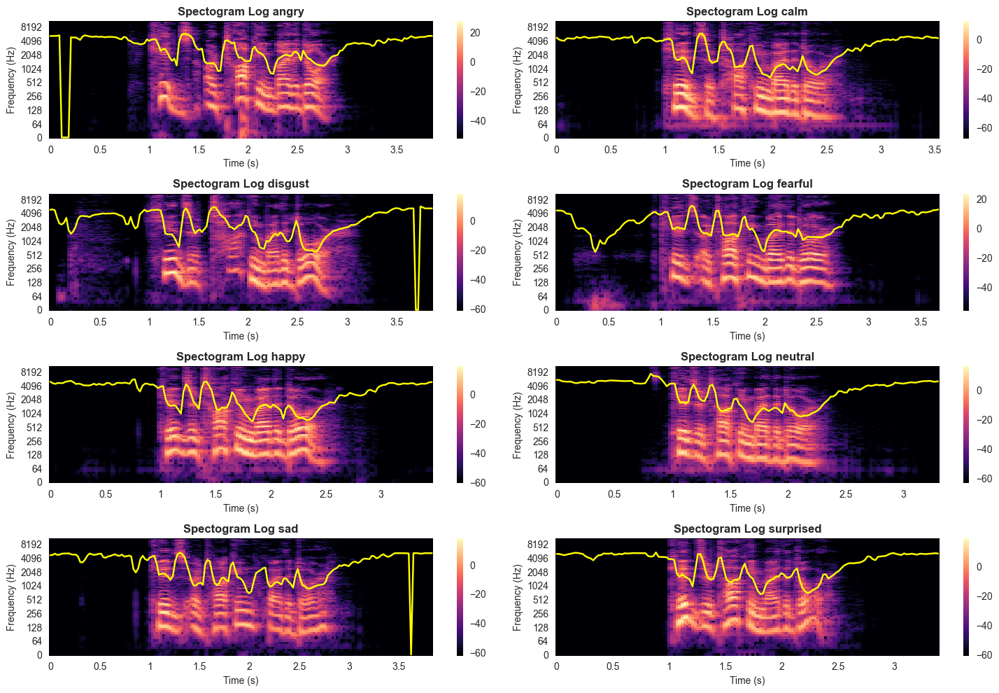

In [86]:
plot_waveplot_with_spectral_centroid(result_ravdess)

## ✨ 6.2 TESS Dataset

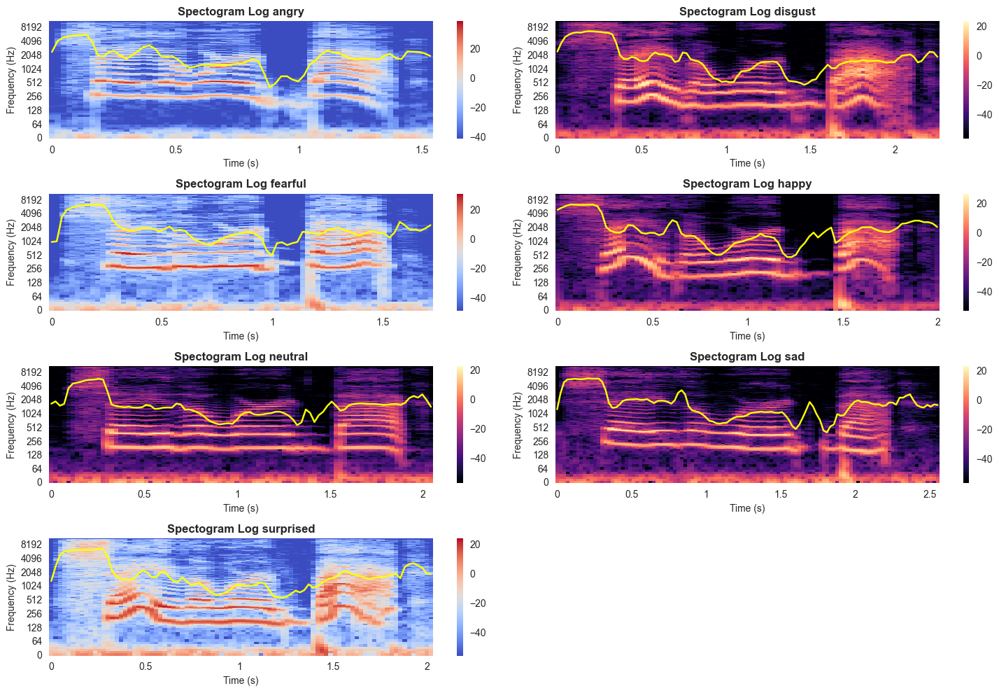

In [87]:
plot_waveplot_with_spectral_centroid(result_tess)

## ✨ 6.3 SAVEE Dataset

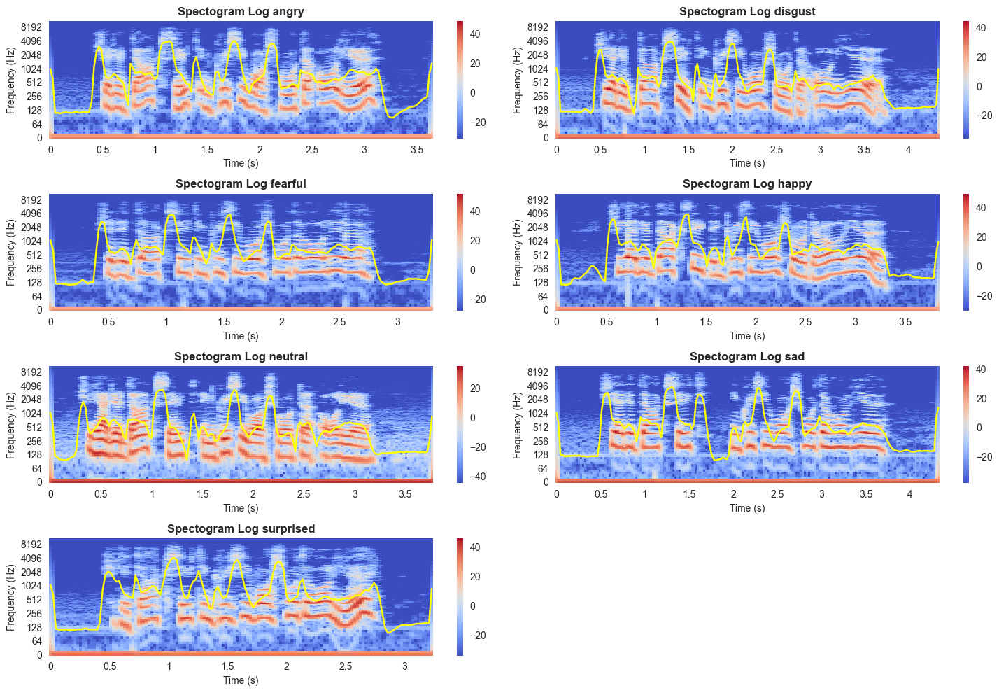

In [88]:
plot_waveplot_with_spectral_centroid(result_savee)

# 🎯 **Step 7: Display spectral roll-off of each label in Log**
---

🔎 Intuitively, the spectral roll-off point indicates the frequency boundary where most of the frequency energy in the signal resides. And then, I show it in the Log because the spectral roll-off is less visible

In [95]:
def plot_spectrogram_with_centroid_and_rolloff(selected_samples):

    num_samples = len(selected_samples)
    num_rows = num_samples // 2 + num_samples % 2  # Menambahkan 1 baris jika jumlah kunci ganjil
    num_cols = 2

    # Buat subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

    for i, (key, audio_info) in enumerate(selected_samples.items()):
        
        row_idx = i // 2
        col_idx = i % 2
        ax = axes[row_idx, col_idx]
        
        data, sampling_rate = librosa.load(audio_info['path'])

        X = librosa.stft(data)
        Xdb = librosa.amplitude_to_db(abs(X))
        img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='log', ax=ax)
        plt.colorbar(img, ax=ax)

        ax.set_title(f'Spectogram Hz {key}',  fontweight='bold')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Frequency (Hz)')

        # Tambahkan plot Spectral Centroid
        spectral_centroids = librosa.feature.spectral_centroid(y=data, sr=sampling_rate)[0]

        spectral_rolloff_up = librosa.feature.spectral_rolloff(y=data, sr=sampling_rate, roll_percent=0.95)[0]
        spectral_rolloff_down = librosa.feature.spectral_rolloff(y=data, sr=sampling_rate, roll_percent=0.01)[0]

        frames = range(len(spectral_centroids))
        t = librosa.frames_to_time(frames)

        ax.plot(t, spectral_rolloff_up, color='white', label='Roll-off frequency (0.95)')
        ax.plot(t, spectral_rolloff_down, color='yellow', label='Roll-off frequency (0.01)')

    # Hapus subplot terakhir jika jumlah kunci ganjil
    if num_samples % 2 == 1:
        fig.delaxes(axes[-1, -1])

    # Sesuaikan tata letak
    plt.tight_layout()
    plt.show()

## ✨ 7.1 RAVDESS Dataset

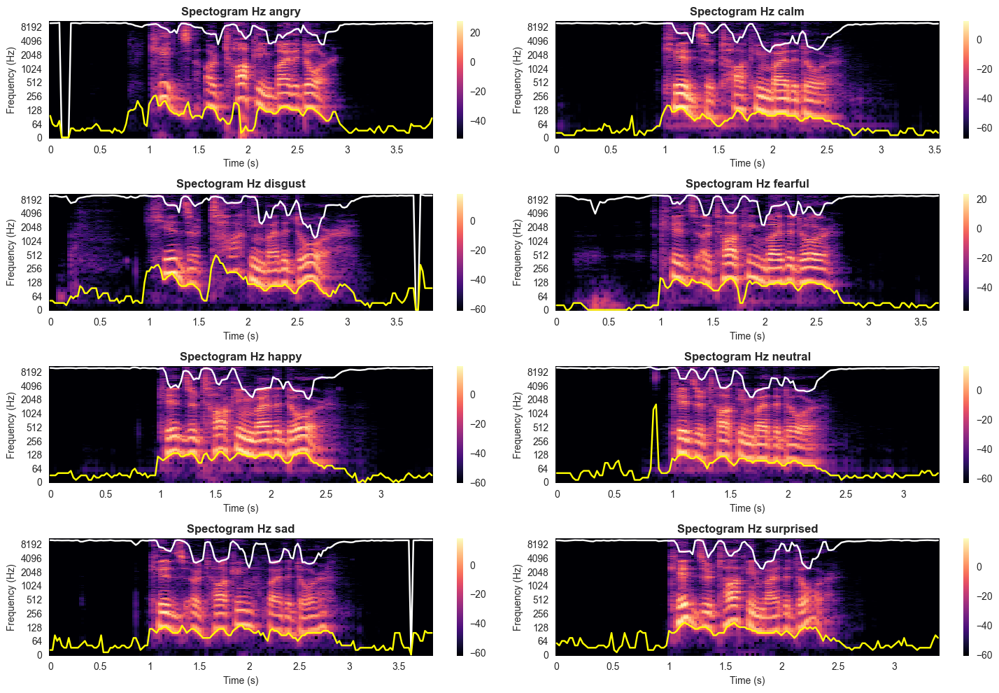

In [96]:
plot_spectrogram_with_centroid_and_rolloff(result_ravdess)

## ✨ 7.2 TESS Dataset

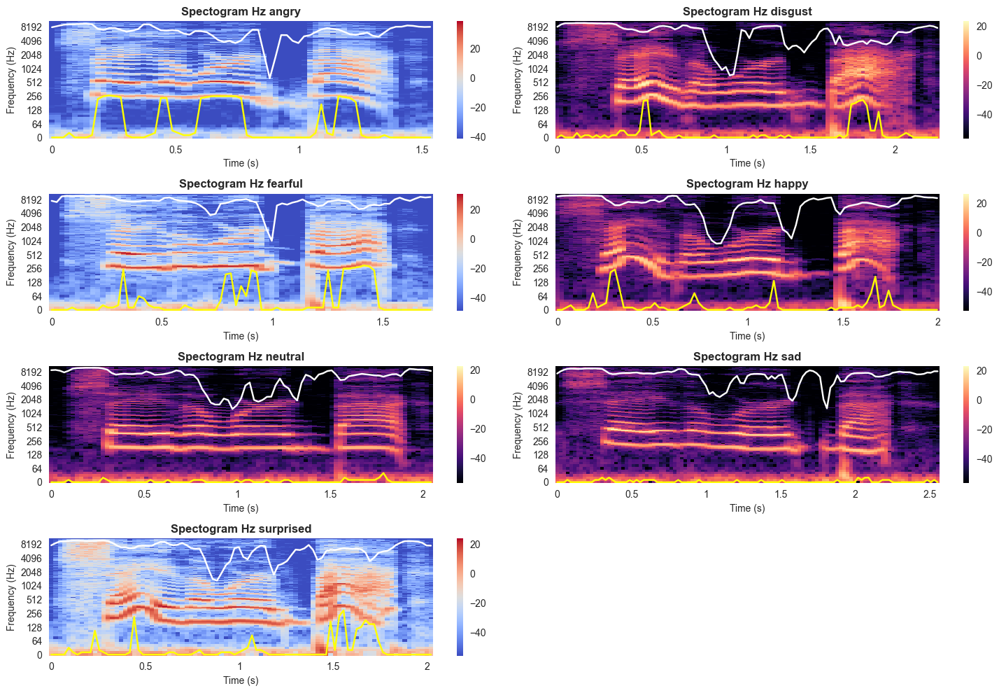

In [97]:
plot_spectrogram_with_centroid_and_rolloff(result_tess)

## ✨ 7.3 SAVEE Dataset

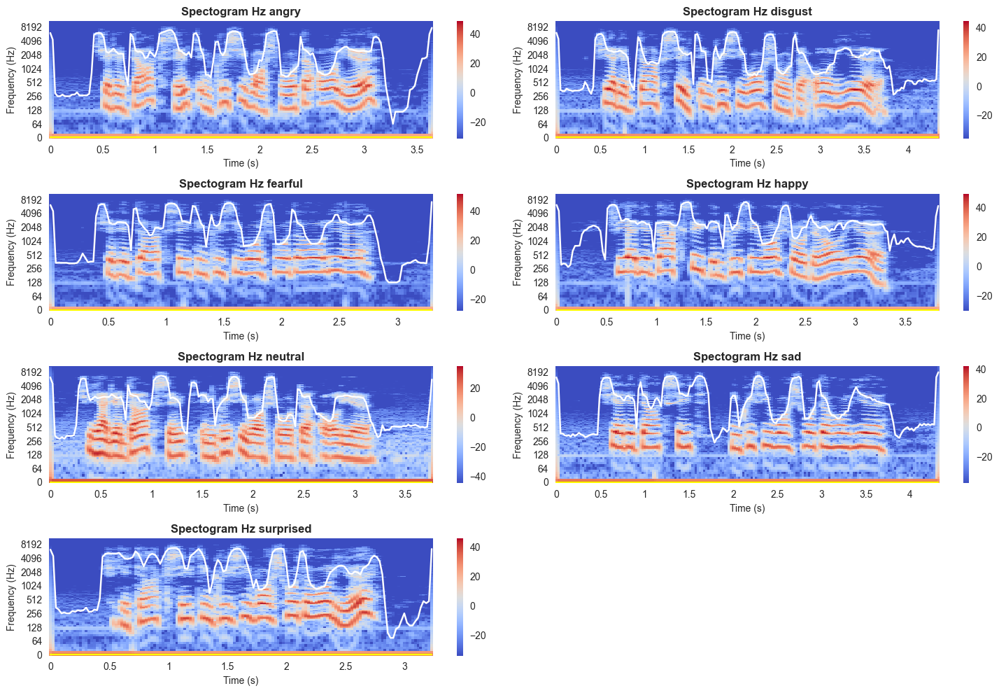

In [99]:
plot_spectrogram_with_centroid_and_rolloff(result_savee)

# 🎯 **Step 8: Display mfcc of each label**
---

🔎 MFCCs can be thought of as “boxes” or “bins” in the histogram. Each MFCC represents the contribution of frequencies in a certain range to a time frame. In other words, MFCCs describe how much energy or frequency information is present in that time frame.

In [101]:
def plot_mfccs(selected_samples):

    num_samples = len(selected_samples)
    num_rows = num_samples // 2 + num_samples % 2  # Menambahkan 1 baris jika jumlah kunci ganjil
    num_cols = 2

    # Buat subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

    for i, (key, audio_info) in enumerate(selected_samples.items()):

        row_idx = i // 2
        col_idx = i % 2
        ax = axes[row_idx, col_idx]

        data, sampling_rate = librosa.load(audio_info['path'])

        mfccs = librosa.feature.mfcc(y=data, sr=sampling_rate)

        img = librosa.display.specshow(mfccs, sr=sampling_rate, x_axis='time', ax=ax)
        plt.colorbar(img, ax=ax)

        ax.set_title(f'MFCC {key}', fontweight='bold')
        ax.set_xlabel('Time (s)')

    # Hapus subplot terakhir jika jumlah kunci ganjil
    if num_samples % 2 == 1:
        fig.delaxes(axes[-1, -1])

    # Sesuaikan tata letak
    plt.tight_layout()
    plt.show()

## ✨ 8.1 RAVDESS Dataset

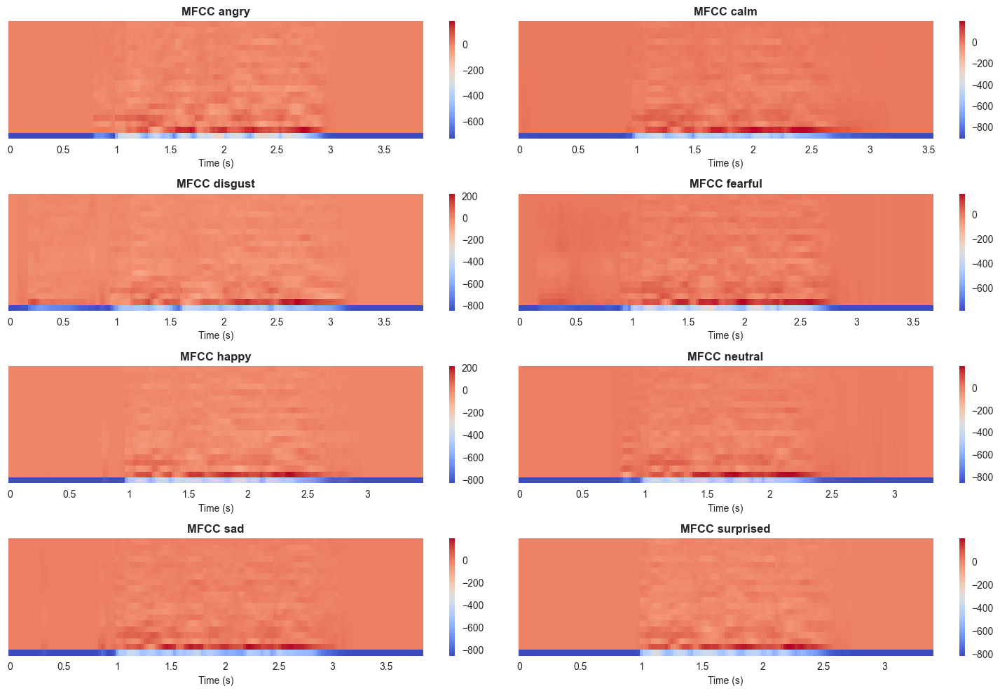

In [102]:
plot_mfccs(result_ravdess)

## ✨ 8.2 TESS Dataset

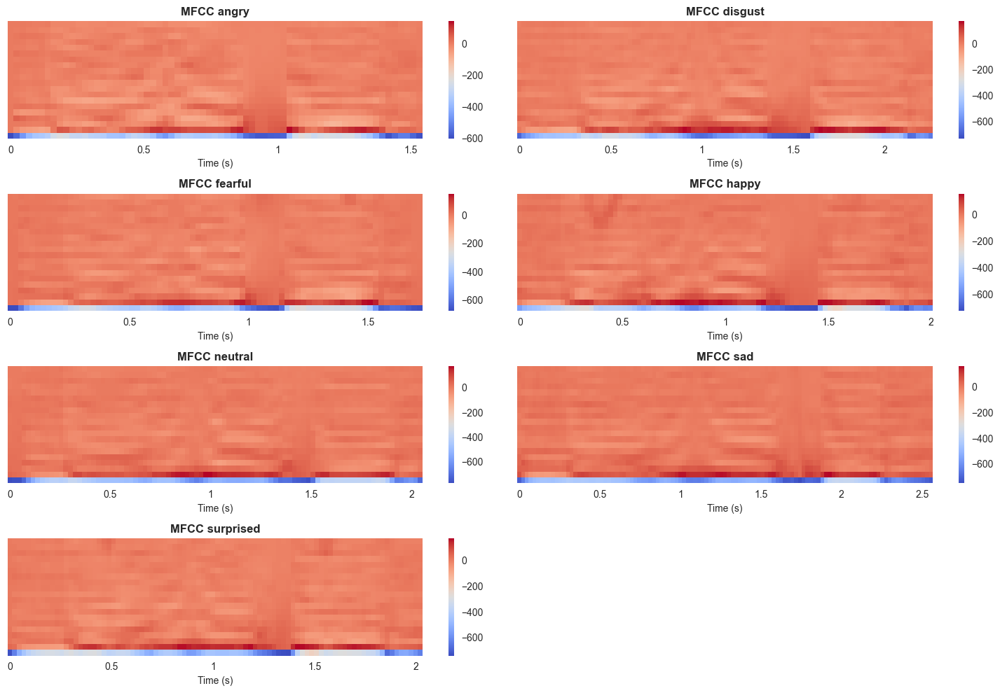

In [103]:
plot_mfccs(result_tess)

## ✨ 8.3 SAVEE Dataset

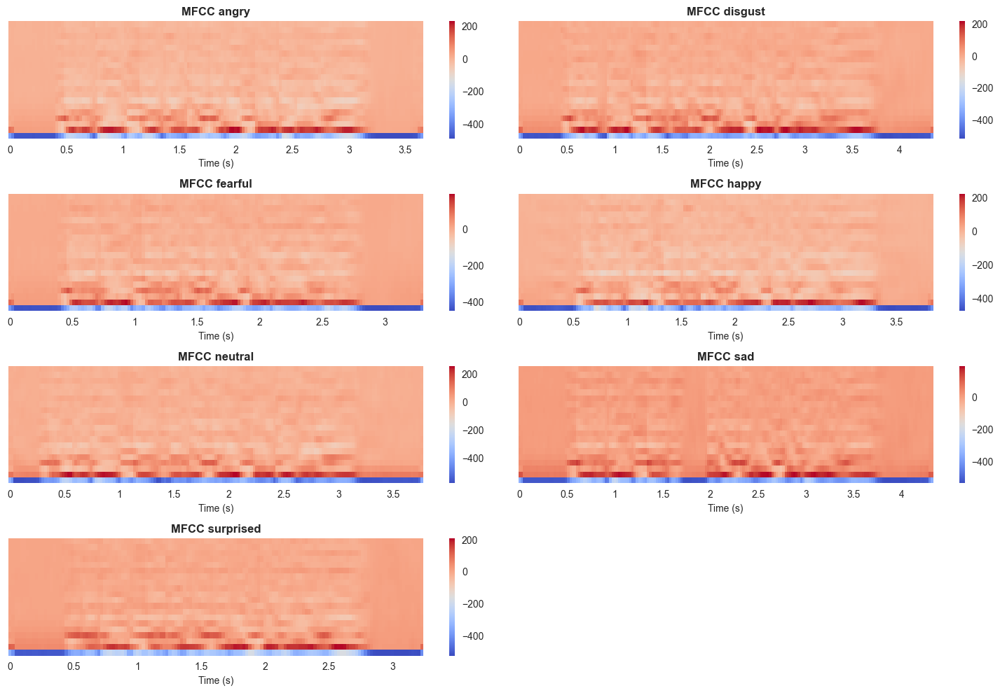

In [104]:
plot_mfccs(result_savee)

# ✅ **Conclusion**

---

Based on the results of the Exploratory Data Analysis (EDA), I did not perform preprocessing because, in this case, I will only be balancing the data in the next file, particularly as mentioned in section 4.5, focusing mainly on the ‘neutral’ and ‘calm’ classes.